## Mixed Attention Parameter Count Analysis

### Imports

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from env.imports import *

/ext3/miniconda3/lib/python3.11/site-packages/pandas/core/arrays/masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (
2025-11-18 10:25:07.669357: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-11-18 10:25:08.519310: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2025-11-18 10:25:08.851115: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2025-11-18 10:25:08.852172: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instruc

In [3]:
import importlib
import data

import models
import sim.sim
import sim.sim_utils
from sim.sim_utils import bytes2human, print_system_usage
from sim.sim import Simulation
from sim.sim_run import single_sim_run
from sim.wandb_scrape import *
from collections import defaultdict

Resorting genes by reference genome order


#### Check job specs

In [4]:
print_system_usage()

total = psutil.disk_usage('/').total
print(bytes2human(total))

CPU Usage: 2.2%
RAM Usage: 2.7%
Available RAM: 1.4T
Total RAM: 1.5T
52.4G


## Wandb API Query <a id="sims"></a>

Data load

In [5]:
from data.data_load import load_transcriptome, load_connectome, load_coords, load_network_labels

from models.bilinear import BilinearCM, BilinearLowRank
from models.dynamic_mlp import DynamicMLP
from models.smt import SharedSelfAttentionModel, SharedSelfAttentionCLSModel
from models.smt_cross import CrossAttentionGeneVecModel, MixedAttentionGeneVecModel

# Load data
print("Loading data...")

full_gene_list='0.2'
hvg_gene_list='100_var'

# Load two versions of gene expression data based on gene lists
X_full, valid_genes_full = load_transcriptome(parcellation='S456', gene_list=full_gene_list, hemisphere='both', omit_subcortical=False, sort_genes='expression', impute_strategy='mirror_interpolate', return_valid_genes=True)
X_hvg, valid_genes_hvg = load_transcriptome(parcellation='S456', gene_list=hvg_gene_list, hemisphere='both', omit_subcortical=False, sort_genes='expression', impute_strategy='mirror_interpolate', return_valid_genes=True)

Y = load_connectome(parcellation='S456', hemisphere='both', omit_subcortical=False)
coords = load_coords(parcellation='S456', hemisphere='both', omit_subcortical=False)
labels, network_labels = load_network_labels(parcellation='S456', hemisphere='both', omit_subcortical=False)

# Find rows that are not all NaN - necessary for gene expression data with unsampled regions
valid_indices = ~np.isnan(X_full).all(axis=1)

# Subset all data using valid indices
X_full_valid = X_full[valid_indices]
X_hvg_valid = X_hvg[valid_indices]
Y_valid = Y[valid_indices][:, valid_indices]
coords_valid = coords[valid_indices]
labels = [labels[i] for i in range(len(labels)) if valid_indices[i]]
network_labels = network_labels[valid_indices]

# prepare data loaders for each type
X_full = torch.tensor(X_full_valid, dtype=torch.float32).to("cuda")
X_hvg = torch.tensor(X_hvg_valid, dtype=torch.float32).to("cuda")
coords = torch.tensor(coords_valid, dtype=torch.float32).to("cuda")

# Create datasets
dataset_full = TensorDataset(X_full, coords)
dataset_hvg = TensorDataset(X_hvg, coords)

# Create dataloaders
dataloader_full = DataLoader(dataset_full, batch_size=X_full_valid.shape[0], shuffle=False)
dataloader_hvg = DataLoader(dataset_hvg, batch_size=X_hvg_valid.shape[0], shuffle=False)

Loading data...
Resorting genes by expression level
Resorting genes by expression level


In [13]:
from data.data_utils import RegionPairDataset

# Create index map so we know true indices of valid data
valid_indices_values = np.where(valid_indices)[0]
valid2true_mapping = dict(enumerate(valid_indices_values))

# Create full pairwise dataset
print("Creating full and HVG pairwise datasets...")

# Create full pairwise dataset
full_dataset = RegionPairDataset(
    X=X_full_valid,
    Y=Y_valid, 
    coords=coords_valid,
    dataset='UKBB',
    parcellation='S456',
    valid2true_mapping=valid2true_mapping,
    valid_genes=valid_genes_full
)

# Create HVG pairwise dataset
hvg_dataset = RegionPairDataset(
    X=X_hvg_valid,
    Y=Y_valid,
    coords=coords_valid, 
    dataset='UKBB',
    parcellation='S456',
    valid2true_mapping=valid2true_mapping,
    valid_genes=valid_genes_hvg
)

print(f"Full dataset: {len(full_dataset)} region pairs")
print(f"HVG dataset: {len(hvg_dataset)} region pairs")

# Create dataloaders
full_dataloader = DataLoader(
    full_dataset,
    batch_size=512,
    shuffle=False,
    num_workers=4,
    pin_memory=True
)

hvg_dataloader = DataLoader(
    hvg_dataset,
    batch_size=512, 
    shuffle=False,
    num_workers=4,
    pin_memory=True
)


Creating full and HVG pairwise datasets...
Full dataset: 206570 region pairs
HVG dataset: 206570 region pairs


In [10]:
# Initialize models with best parameters for each gene list

# Bilinear CM
bilinear_cm_hvg = BilinearCM(
    input_dim=X_hvg.shape[1]*2,
    learning_rate=0.0005,
    batch_size=512,
    regularization='l2',
    lambda_reg=0.1
).to('cuda')

# Bilinear Lowrank
bilinear_lr_hvg = BilinearLowRank(
    input_dim=X_hvg.shape[1]*2,
    activation='none',
    learning_rate=0.0001,
    batch_size=256,
    regularization='l2', 
    lambda_reg=0.001,
    shared_weights=True,
    reduced_dim=10
).to('cuda')

bilinear_lr_full = BilinearLowRank(
    input_dim=X_full.shape[1]*2,
    activation='none', 
    learning_rate=0.0001,
    batch_size=256,
    regularization='l2',
    lambda_reg=0.001,
    shared_weights=True,
    reduced_dim=10
).to('cuda')

# Dynamic MLP
dynamic_mlp_hvg = DynamicMLP(
    input_dim=X_hvg.shape[1]*2,
    hidden_dims=[512, 256, 128],
    learning_rate=0.00009,
    batch_size=512,
    dropout_rate=0.1,
    weight_decay=0.0001
).to('cuda')

# Cross Attention GeneVec
cross_attention_hvg = CrossAttentionGeneVecModel(
    input_dim=X_hvg.shape[1],
    region_pair_dataset=hvg_dataset,
    expression_bins=5,
    genevec_type='gene2vec',
    d_model=32,
    nhead=2,
    num_layers=2,
    deep_hidden_dims=[256, 128, 64],
    cls_init='random',
    pooling_mode='attention',
    use_alibi=True,
    transformer_dropout=0.3,
    dropout_rate=0.1,
    learning_rate=0.00009,
    weight_decay=0.001,
    bidirectional=True
    ).to('cuda')


# Cross Attention GeneVec
mixed_attention_hvg = MixedAttentionGeneVecModel(
    input_dim=X_hvg.shape[1],
    region_pair_dataset=hvg_dataset,
    expression_bins=5,
    genevec_type='gene2vec',
    d_model=64,
    nhead=2,
    num_layers=2,
    deep_hidden_dims=[256, 128, 64],
    pooling_mode='attention',
    use_alibi=True,
    transformer_dropout=0.2,
    dropout_rate=0.1,
    learning_rate=0.00009,
    weight_decay=0.001
    ).to('cuda')

# Shared Transformer (only for full gene list)
shared_transformer_full = SharedSelfAttentionModel(
    input_dim=X_full.shape[1]*2,
    token_encoder_dim=60,
    d_model=128,
    encoder_output_dim=10,
    use_alibi=True,
    nhead=4,
    num_layers=4,
    deep_hidden_dims=[512, 256, 128],
    transformer_dropout=0.2,
    dropout_rate=0.2,
    learning_rate=0.00009,
    weight_decay=0.0001
).to('cuda')

# Dynamic MLP
dynamic_mlp_full = DynamicMLP(
    input_dim=X_full.shape[1]*2,
    hidden_dims=[512, 256, 128],
    learning_rate=0.00009,
    batch_size=512,
    dropout_rate=0.1,
    weight_decay=0.0001
).to('cuda')

Total number of learnable parameters in BilinearCMmodel: 10001


  warnings.warn(



Number of learnable parameters in Bilinear low rank model: 1000
  Linear layer 1: 1000 parameters
Number of learnable parameters in Bilinear low rank model: 73800
  Linear layer 1: 73800 parameters
Number of learnable parameters in MLP: 269057


TypeError: CrossAttentionGeneVecModel.__init__() got an unexpected keyword argument 'cls_init'

In [9]:
def fetch_and_summarize_wandb_runs(model, cv_type, null_model, gene_list='0.2', feature_type='transcriptome', target='FC', within_last=60, before_last=0, use_weighted=False, exclude='HCP', return_history=False):
    """
    Fetches wandb runs matching specific tags and summarizes their final train/test metrics.
    Handles different CV types with their expected number of runs:
    - random/spatial: 40 runs
    - schaefer: 9 runs  
    - lobe: 6 runs
    
    Args:
        model (str): Model name, e.g., 'bilinear_CM'
        cv_type (str): CV type, one of: 'random', 'spatial', 'schaefer', 'lobe'
        null_model (str): Null model label, e.g., 'none'
        feature_type (str): Feature type, e.g., 'transcriptome_PCA'
        target (str): Target connectome type, e.g., 'FC'
        within_last (int): Search for runs within this many days ago (default: 60)
        before_last (int): Exclude runs from this many days ago (default: 0)
        use_weighted (bool): Whether to compute weighted statistics for schaefer/lobe CV
        exclude (str): Dataset to exclude from search (default: 'HCP')
        return_history (bool): If True, return (summary_df, history_df) tuple
    
    Returns:
        summary_df (pd.DataFrame): DataFrame with mean, std, stderr of all train/test metrics
                                  If use_weighted=True and cv_type in ['schaefer', 'lobe'], 
                                  includes weighted_mean and weighted_stderr rows
        history_df (pd.DataFrame): Individual run data (only returned if return_history=True)
    """
    # Set time filters
    end_time = datetime.now() - timedelta(days=before_last)
    start_time = datetime.now() - timedelta(days=within_last)
    
    # Set expected number of runs based on cv_type
    if cv_type == "schaefer":
        expected_runs = 9
    elif cv_type == "lobe":
        expected_runs = 6
    else:  # random or spatial
        expected_runs = 40
    filters = {
        "tags": {
            "$all": [
                "final_eval",
                f"model_{model}",
                f"target_{target}",
                f"cv_type_{cv_type}",
                f"null_model_{null_model}",
                f"feature_type_{feature_type}",
                f"gene_list_{gene_list}"  # Fixed: Removed comma and added proper string formatting
            ],
        },
        "created_at": {
            "$gte": start_time.isoformat(), 
            "$lte": end_time.isoformat()
        },
        "state": "finished"
    }
    
    # Add exclusion filter if specified
    if exclude != "":
        filters["tags"]["$nin"] = [f"dataset_{exclude}"]
    
    print(f"🔍 Fetching runs for: model={model}, cv_type={cv_type}, null_model={null_model}, feature_type={feature_type}")
    runs = api.runs(project_path, filters=filters, order="-created_at")
    
    run_data = []
    for run in runs:
        metrics = {}
        summary = run.summary

        # Attempt to extract the pearson_r value (or set to NaN if missing)
        pearson = summary.get("final_test_metrics", {}).get("pearson_r", np.nan)

        # Only consider runs with meaningful final_test_metrics
        if "final_test_metrics" not in summary:
            continue
        
        for k, v in summary.get('final_train_metrics', {}).items():
            if isinstance(v, (int, float)):
                metrics[f'train_{k}'] = v

        for k, v in summary.get('final_test_metrics', {}).items():
            if isinstance(v, (int, float)):
                metrics[f'test_{k}'] = v

        metrics['run_name'] = run.name
        metrics['run_id'] = run.id
        metrics['final_test_pearson_r'] = pearson
        
        # Extract fold number for weighted calculations
        if use_weighted and cv_type in ['schaefer', 'lobe']:
            fold_match = re.search(r'fold(\d+)', run.name)
            if fold_match:
                metrics['fold'] = int(fold_match.group(1))
        
        run_data.append(metrics)
    
    df = pd.DataFrame(run_data)

    print(f"📊 Found {len(df)} total runs")

    if len(df) < expected_runs:
        raise ValueError(f"❌ Expected {expected_runs} runs, but found {len(df)}.")

    # Handle deduplication based on CV type
    if use_weighted and cv_type in ['schaefer', 'lobe']:
        # Sort by fold number for proper weight assignment
        df = df.sort_values('fold')
        # Deduplicate by fold keeping highest test pearson_r within each fold
        df_unique = (
            df.sort_values(["fold", "final_test_pearson_r"], ascending=[True, False])
              .drop_duplicates("fold", keep="first")
        )
        print(f"📊 After deduplication: {len(df_unique)} unique runs")
        if len(df_unique) != expected_runs:
            raise ValueError(f"❌ Expected {expected_runs} unique folds, found {len(df_unique)} after deduplication.")
    else:
        # Deduplicate by run_name using highest test pearson_r
        df_unique = (
            df.sort_values("final_test_pearson_r", ascending=False)
              .drop_duplicates("run_name", keep="first")
        )
        print(f"📊 After deduplication: {len(df_unique)} unique runs")
        if len(df_unique) != expected_runs:
            raise ValueError(f"❌ Expected {expected_runs} unique run names, found {len(df_unique)} after deduplication.")

    # Store history before cleaning for aggregation
    history_df = df_unique.copy()
    
    # Clean and summarize
    columns_to_drop = ["run_name", "run_id", "final_test_pearson_r"]
    if 'fold' in df_unique.columns:
        columns_to_drop.append("fold")
    df_clean = df_unique.drop(columns=columns_to_drop, errors="ignore")

    summary_df = pd.DataFrame({
        "mean": df_clean.mean(),
        "std": df_clean.std(),
        "stderr": df_clean.sem()
    }).T
    
    # Add weighted statistics if requested and applicable
    if use_weighted and cv_type in ['schaefer', 'lobe']:
        weights = list(CV_WEIGHTS[cv_type].values())
        
        # Calculate weighted statistics for final_test_pearson_r
        weighted_mean, weighted_se = weighted_mean_and_se(df_unique['final_test_pearson_r'].values, weights)
        summary_df.loc['weighted_mean', 'final_test_pearson_r'] = weighted_mean
        summary_df.loc['weighted_stderr', 'final_test_pearson_r'] = weighted_se
        
        # Calculate weighted statistics for test_pearson_r if it exists
        if 'test_pearson_r' in df_clean.columns:
            test_pearson_values = df_unique['test_pearson_r'].values if 'test_pearson_r' in df_unique.columns else df_clean['test_pearson_r'].values
            weighted_mean_test, weighted_se_test = weighted_mean_and_se(test_pearson_values, weights)
            summary_df.loc['weighted_mean', 'test_pearson_r'] = weighted_mean_test
            summary_df.loc['weighted_stderr', 'test_pearson_r'] = weighted_se_test

    if return_history:
        return summary_df, history_df
    else:
        return summary_df

In [10]:
# Global parameters for spatial CV
cv_type = 'random'

# Create dictionary to store random results
random_results = {}

# Bilinear lowrank HVG
within_last, before_last = 30, 0
random_results['bilinear_lowrank_hvg'] = fetch_and_summarize_wandb_runs('bilinear_lowrank', cv_type=cv_type, null_model='none', gene_list='100_var', feature_type='transcriptome', target='FC', within_last=within_last, before_last=before_last, use_weighted=False, exclude='HCP', return_history=False)

# Bilinear lowrank full
within_last, before_last = 120, 0 
random_results['bilinear_lowrank_full'] = fetch_and_summarize_wandb_runs('bilinear_lowrank', cv_type=cv_type, null_model='none', gene_list='0.2', feature_type='transcriptome', target='FC', within_last=within_last, before_last=before_last, use_weighted=False, exclude='HCP', return_history=False)

# Bilinear CM HVG
within_last, before_last = 30, 0
random_results['bilinear_cm_hvg'] = fetch_and_summarize_wandb_runs('bilinear_CM', cv_type=cv_type, null_model='none', gene_list='100_var', feature_type='transcriptome', target='FC', within_last=within_last, before_last=before_last, use_weighted=False, exclude='HCP', return_history=False)

# Dynamic MLP HVG
within_last, before_last = 30, 0
random_results['dynamic_mlp_hvg'] = fetch_and_summarize_wandb_runs('dynamic_mlp', cv_type=cv_type, null_model='none', gene_list='100_var', feature_type='transcriptome', target='FC', within_last=within_last, before_last=before_last, use_weighted=False, exclude='HCP', return_history=False)

# Cross attention genevec HVG
within_last, before_last = 30, 0
random_results['cross_attention_genevec_hvg'] = fetch_and_summarize_wandb_runs('cross_attention_genevec', cv_type=cv_type, null_model='none', gene_list='100_var', feature_type='transcriptome', target='FC', within_last=within_last, before_last=before_last, use_weighted=False, exclude='HCP', return_history=False)

# # Mixed attention genevec HVG
# within_last, before_last = 30, 0
# random_results['mixed_attention_genevec_hvg'] = fetch_and_summarize_wandb_runs('mixed_attention_genevec', cv_type=cv_type, null_model='none', gene_list='100_var', feature_type='transcriptome', target='FC', within_last=within_last, before_last=before_last, use_weighted=False, exclude='HCP', return_history=False)

# Shared transformer full
within_last, before_last = 35, 29
random_results['shared_transformer_full'] = fetch_and_summarize_wandb_runs('shared_transformer', cv_type=cv_type, null_model='none', gene_list='0.2', feature_type='transcriptome', target='FC', within_last=within_last, before_last=before_last, use_weighted=False, exclude='HCP', return_history=False)

# Dynamic MLP full
within_last, before_last = 37, 27
random_results['dynamic_mlp_full'] = fetch_and_summarize_wandb_runs('dynamic_mlp', cv_type=cv_type, null_model='none', gene_list='0.2', feature_type='transcriptome', target='FC', within_last=within_last, before_last=before_last, use_weighted=False, exclude='HCP', return_history=False)

🔍 Fetching runs for: model=bilinear_lowrank, cv_type=random, null_model=none, feature_type=transcriptome
📊 Found 47 total runs
📊 After deduplication: 40 unique runs
🔍 Fetching runs for: model=bilinear_lowrank, cv_type=random, null_model=none, feature_type=transcriptome


wandb: WARNING A graphql request initiated by the public wandb API timed out (timeout=19 sec). Create a new API with an integer timeout larger than 19, e.g., `api = wandb.Api(timeout=29)` to increase the graphql timeout.
wandb: WARNING A graphql request initiated by the public wandb API timed out (timeout=19 sec). Create a new API with an integer timeout larger than 19, e.g., `api = wandb.Api(timeout=29)` to increase the graphql timeout.


ReadTimeout: HTTPSConnectionPool(host='api.wandb.ai', port=443): Read timed out. (read timeout=19)

In [11]:
cv_type = 'spatial'

# Create dictionary to store spatial results
spatial_results = {}

# Bilinear lowrank HVG
within_last, before_last = 30, 0
spatial_results['bilinear_lowrank_hvg'] = fetch_and_summarize_wandb_runs('bilinear_lowrank', cv_type=cv_type, null_model='none', gene_list='100_var', feature_type='transcriptome', target='FC', within_last=within_last, before_last=before_last, use_weighted=False, exclude='HCP', return_history=False)

# Bilinear lowrank full
within_last, before_last = 120, 0 
spatial_results['bilinear_lowrank_full'] = fetch_and_summarize_wandb_runs('bilinear_lowrank', cv_type=cv_type, null_model='none', gene_list='0.2', feature_type='transcriptome', target='FC', within_last=within_last, before_last=before_last, use_weighted=False, exclude='HCP', return_history=False)

# Bilinear CM HVG
within_last, before_last = 30, 0
spatial_results['bilinear_cm_hvg'] = fetch_and_summarize_wandb_runs('bilinear_CM', cv_type=cv_type, null_model='none', gene_list='100_var', feature_type='transcriptome', target='FC', within_last=within_last, before_last=before_last, use_weighted=False, exclude='HCP', return_history=False)

# Dynamic MLP HVG
within_last, before_last = 30, 0
spatial_results['dynamic_mlp_hvg'] = fetch_and_summarize_wandb_runs('dynamic_mlp', cv_type=cv_type, null_model='none', gene_list='100_var', feature_type='transcriptome', target='FC', within_last=within_last, before_last=before_last, use_weighted=False, exclude='HCP', return_history=False)

# Cross attention genevec HVG
within_last, before_last = 30, 0
spatial_results['cross_attention_genevec_hvg'] = fetch_and_summarize_wandb_runs('cross_attention_genevec', cv_type=cv_type, null_model='none', gene_list='100_var', feature_type='transcriptome', target='FC', within_last=within_last, before_last=before_last, use_weighted=False, exclude='HCP', return_history=False)

# Mixed attention genevec HVG
within_last, before_last = 10, -1
spatial_results['mixed_attention_genevec_hvg'] = fetch_and_summarize_wandb_runs('mixed_attention_genevec', cv_type=cv_type, null_model='none', gene_list='100_var', feature_type='transcriptome', target='FC', within_last=within_last, before_last=before_last, use_weighted=False, exclude='HCP', return_history=False)

# Shared transformer full
within_last, before_last = 35, 29
spatial_results['shared_transformer_full'] = fetch_and_summarize_wandb_runs('shared_transformer', cv_type=cv_type, null_model='none', gene_list='0.2', feature_type='transcriptome', target='FC', within_last=within_last, before_last=before_last, use_weighted=False, exclude='HCP', return_history=False)

# Dynamic MLP full
within_last, before_last = 37, 27
spatial_results['dynamic_mlp_full'] = fetch_and_summarize_wandb_runs('dynamic_mlp', cv_type=cv_type, null_model='none', gene_list='0.2', feature_type='transcriptome', target='FC', within_last=within_last, before_last=before_last, use_weighted=False, exclude='HCP', return_history=False)

🔍 Fetching runs for: model=bilinear_lowrank, cv_type=spatial, null_model=none, feature_type=transcriptome
📊 Found 56 total runs
📊 After deduplication: 40 unique runs
🔍 Fetching runs for: model=bilinear_lowrank, cv_type=spatial, null_model=none, feature_type=transcriptome
📊 Found 40 total runs
📊 After deduplication: 40 unique runs
🔍 Fetching runs for: model=bilinear_CM, cv_type=spatial, null_model=none, feature_type=transcriptome
📊 Found 80 total runs
📊 After deduplication: 40 unique runs
🔍 Fetching runs for: model=dynamic_mlp, cv_type=spatial, null_model=none, feature_type=transcriptome
📊 Found 160 total runs
📊 After deduplication: 40 unique runs
🔍 Fetching runs for: model=cross_attention_genevec, cv_type=spatial, null_model=none, feature_type=transcriptome
📊 Found 332 total runs
📊 After deduplication: 40 unique runs
🔍 Fetching runs for: model=mixed_attention_genevec, cv_type=spatial, null_model=none, feature_type=transcriptome
📊 Found 225 total runs
📊 After deduplication: 40 unique ru

In [20]:
def plot_param_count_vs_performance(random_results, spatial_results, metric='test_long_r'):
    # Print only spatial split test metrics for each model
    print("\nSpatial Split Test Metrics:") 
    print("-" * 50)
    for model_key in spatial_results.keys():
        print(f"{model_key}: {metric} = {spatial_results[model_key].loc['mean', metric]:.4f}")

    # Dictionary to store parameter counts for each model
    param_counts = {
        'bilinear_cm_hvg': 10001,  # HVG gene set 
        'bilinear_lowrank_hvg': 1000,  # HVG gene set
        'bilinear_lowrank_full': 73800,  # 0.2 gene set
        'dynamic_mlp_hvg': 269057,  # HVG gene set
        'cross_attention_genevec_hvg': 85960,  # HVG gene set 
        'mixed_attention_genevec_hvg': 182402,  # HVG gene set: mixed attention model
        'shared_transformer_full': 2162315,  # 0.2 gene set
        'dynamic_mlp_full': 7723777  # 0.2 gene set
    }

    # Model name mapping for abbreviated labels
    model_names = {
        'bilinear_cm_hvg': 'Bilinear CM',
        'bilinear_lowrank_hvg': 'Bilinear LR', 
        'bilinear_lowrank_full': 'Bilinear LR',
        'dynamic_mlp_hvg': 'MLP',
        'cross_attention_genevec_hvg': 'SMT Cross',
        'mixed_attention_genevec_hvg': 'SMT Mixed',
        'shared_transformer_full': 'SMT',
        'dynamic_mlp_full': 'MLP'
    }
    
    # Global parameters for visualization (match styling as in NeurIPS_param_count.ipynb)
    MARKER_SIZE = 15
    FONT_SIZE = 17

    # Plot for spatial CV
    fig, ax = plt.subplots(1, 1, figsize=(7.5, 6), dpi=150)
    x_spatial_hvg = []
    y_spatial_hvg = []
    labels_spatial_hvg = []

    x_spatial_full = []
    y_spatial_full = []
    labels_spatial_full = []

    # Split into HVG and full gene set models
    for model_key in spatial_results.keys():
        if model_key in param_counts:
            if 'hvg' in model_key:
                x_spatial_hvg.append(param_counts[model_key])
                y_spatial_hvg.append(spatial_results[model_key].loc['mean', metric])
                labels_spatial_hvg.append(model_names[model_key])
            else:
                x_spatial_full.append(param_counts[model_key])
                y_spatial_full.append(spatial_results[model_key].loc['mean', metric])
                labels_spatial_full.append(model_names[model_key])

    if len(x_spatial_hvg) > 0:
        ax.plot(x_spatial_hvg, y_spatial_hvg, 'go', markersize=MARKER_SIZE, label='HVG genes (top 100)')
        for i, label in enumerate(labels_spatial_hvg):
            ax.annotate(label, (x_spatial_hvg[i], y_spatial_hvg[i]), xytext=(5, 5), textcoords='offset points', fontsize=FONT_SIZE)

    if len(x_spatial_full) > 0:
        ax.plot(x_spatial_full, y_spatial_full, 'bo', markersize=MARKER_SIZE, label='SRS genes (full set)')
        for i, label in enumerate(labels_spatial_full):
            ax.annotate(label, (x_spatial_full[i], y_spatial_full[i]), xytext=(5, 5), textcoords='offset points', fontsize=FONT_SIZE)

    # Map metric names to display names
    metric_display_names = {
        'test_pearson_r': 'Pearson-r',
        'test_mse': 'Mean-Squared Error',
        'test_long_r': 'Long-range Pearson-r',
        'test_short_r': 'Short-range Pearson-r',
        'test_strong_pos_r': 'Strong Pos. Edge Pearson-r',
        'test_strong_neg_r': 'Strong Neg. Edge Pearson-r',
        'geodesic': 'Geodesic Distance'
    }
    display_metric = metric_display_names.get(metric, metric)

    # Set log scale, ticks, grid style as NeurIPS_param_count.ipynb and set xlim to start at 10^3
    ax.set_xscale('log')
    import matplotlib.ticker as ticker
    # Define major/minor ticks as reference
    major_ticks = [10**i for i in range(3, 9)]
    minor_ticks = []
    for i in range(len(major_ticks)-1):
        for j in range(2, 10):
            minor_ticks.append(j * major_ticks[i])

    ax.set_xticks(major_ticks)
    ax.set_xticks(minor_ticks, minor=True)
    ax.set_xlim([1e3, max(
        [param_counts[k] for k in param_counts]
        + x_spatial_hvg + x_spatial_full
    )*1.05])

    # Grid styling
    ax.grid(True, which="major", color="0.9", linewidth=1.0)
    # ax.grid(True, which="minor", color="0.95", linewidth=0.5)

    # Adjust axis limits for clarity and style
    y_values = [spatial_results[model_key].loc['mean', metric] 
        for model_key in spatial_results.keys() if model_key in param_counts]
    if y_values:
        ymin, ymax = min(y_values), max(y_values)
        margin = (ymax - ymin) * .2 if ymax > ymin else 0.1
        ax.set_ylim(ymin - margin, ymax + margin)

    # Set y-axis ticks formatter: 3 decimal places if metric is mse, else 2
    if metric == "test_mse":
        ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, p: f'{x:.3f}'.lstrip('0')))
    else:
        ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, p: f'{x:.2f}'.lstrip('0')))

    ax.set_xlabel('Number of Parameters (log scale)', fontsize=FONT_SIZE)
    ax.set_ylabel(f'{display_metric}', fontsize=FONT_SIZE)
    ax.set_title('Spatial Split Test Performance vs Model Size', fontsize=FONT_SIZE)
    ax.legend(fontsize=FONT_SIZE)

    plt.tight_layout()
    plt.show()


Spatial Split Test Metrics:
--------------------------------------------------
bilinear_lowrank_hvg: test_pearson_r = 0.4411
bilinear_lowrank_full: test_pearson_r = 0.6599
bilinear_cm_hvg: test_pearson_r = 0.5744
dynamic_mlp_hvg: test_pearson_r = 0.7195
cross_attention_genevec_hvg: test_pearson_r = 0.6692
mixed_attention_genevec_hvg: test_pearson_r = 0.5997
shared_transformer_full: test_pearson_r = 0.7194
dynamic_mlp_full: test_pearson_r = 0.7212


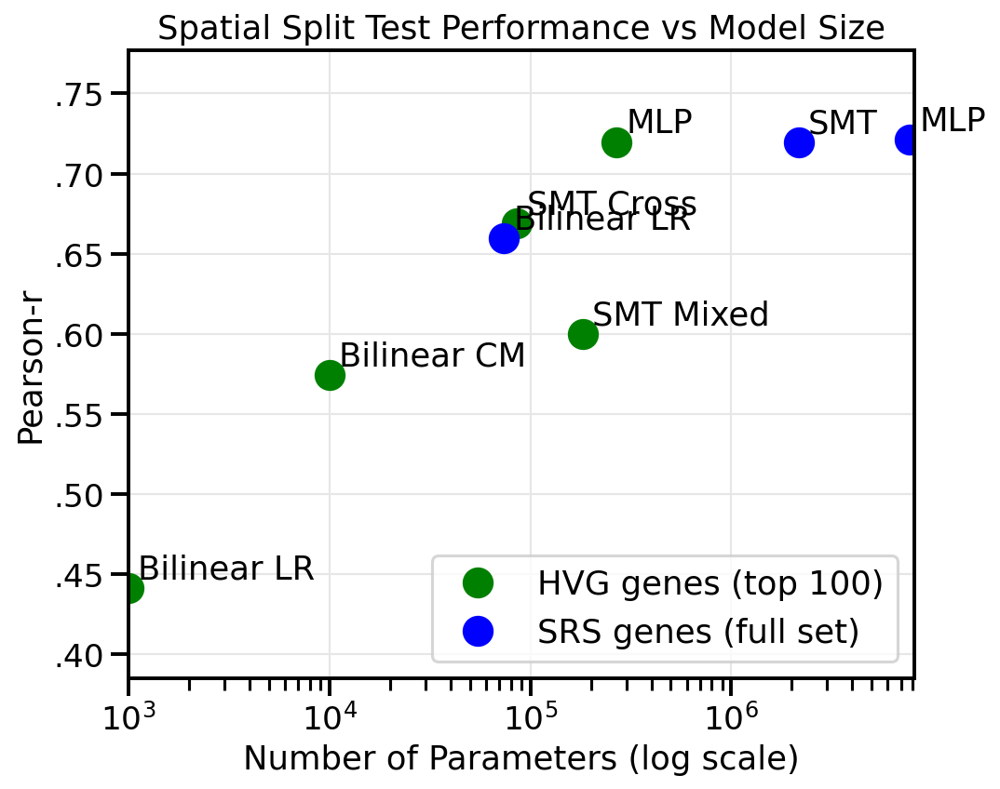

In [21]:
plot_param_count_vs_performance(random_results, spatial_results, metric='test_pearson_r')



Spatial Split Test Metrics:
--------------------------------------------------
bilinear_lowrank_hvg: test_mse = 0.0362
bilinear_lowrank_full: test_mse = 0.0248
bilinear_cm_hvg: test_mse = 0.0296
dynamic_mlp_hvg: test_mse = 0.0213
cross_attention_genevec_hvg: test_mse = 0.0242
mixed_attention_genevec_hvg: test_mse = 0.0296
shared_transformer_full: test_mse = 0.0224
dynamic_mlp_full: test_mse = 0.0232


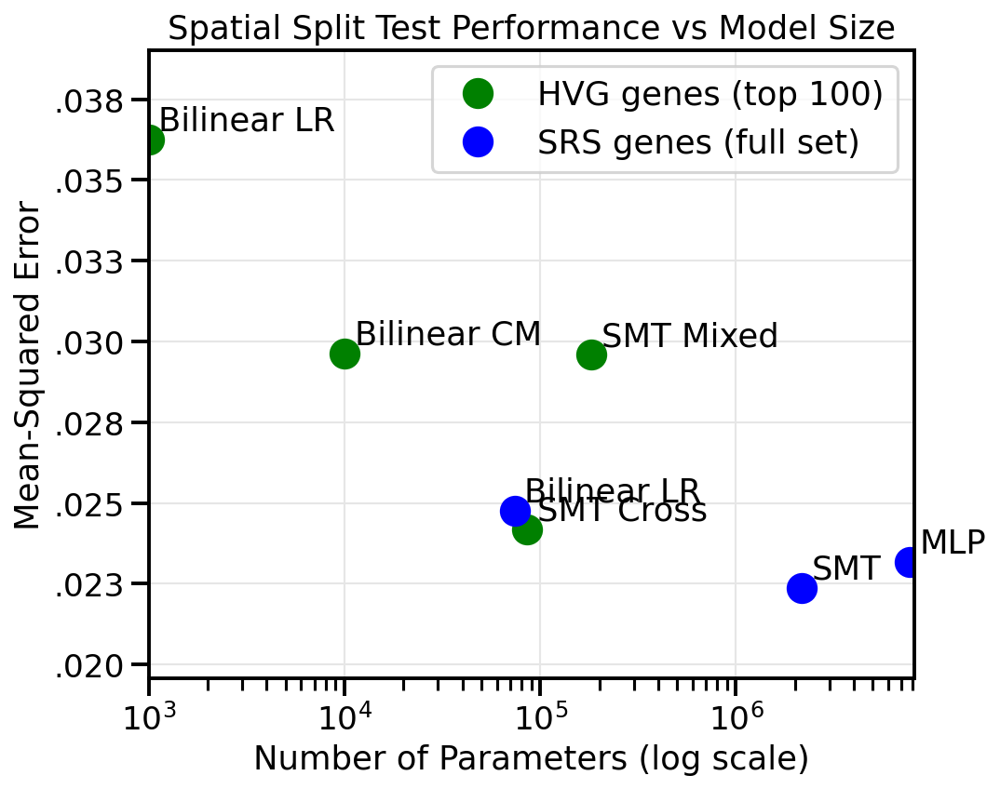

In [19]:
plot_param_count_vs_performance(random_results, spatial_results, metric='test_mse')


Grab O matrix from Bilinear CM

In [13]:
from models.bilinear import BilinearLoss

class BilinearCM(nn.Module):
    def __init__(self, input_dim, binarize=None, learning_rate=0.01, epochs=100, 
                 batch_size=128, regularization='l2', lambda_reg=1.0, bias=True):
        super().__init__()
        self.learning_rate = learning_rate
        self.epochs = epochs
        self.batch_size = batch_size
        self.regularization = regularization
        self.lambda_reg = lambda_reg
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

        self.bilinear = nn.Bilinear(input_dim//2, input_dim//2, 1, bias=bias)

        num_params = sum(p.numel() for p in self.parameters() if p.requires_grad)
        print(f"Total number of learnable parameters in BilinearCMmodel: {num_params}")
        
        self.criterion = BilinearLoss(self.parameters(), regularization=regularization, lambda_reg=lambda_reg)

    def forward(self, x):
        x_i, x_j = torch.chunk(x, chunks=2, dim=1)
        return self.bilinear(x_i, x_j).squeeze()

    def fit_closed_form(self, dataset):
        """
        Fit model using closed form solution in original matrix form.
        Returns the loss and learned O matrix.
        """
        # Get original full matrices
        X_full = dataset.X.to(self.device)
        Y_full = dataset.Y.to(self.device)

        # Compute inverse of regularized Gram matrix
        A = torch.mm(X_full.T, X_full) + self.lambda_reg * torch.eye(X_full.shape[1], device=self.device)
        A_inv = torch.linalg.inv(A)
        
        # Estimate O from closed-form solution
        O = torch.mm(A_inv, torch.mm(X_full.T, torch.mm(Y_full, torch.mm(X_full, A_inv))))
        
        # Compute bilinear prediction
        Y_lin = torch.mm(torch.mm(X_full, O), X_full.T)
        
        # Learn scalar bias to minimize mean residual
        b = torch.mean(Y_full - Y_lin)
        
        # Map parameters to bilinear layer
        O_reshaped = O.reshape(1, X_full.shape[1], X_full.shape[1])
        self.bilinear.weight.data = O_reshaped
        if self.bilinear.bias is not None:
            self.bilinear.bias.data = b.reshape(1)

        # Get predictions using full dataset
        train_loader = DataLoader(dataset, batch_size=self.batch_size, shuffle=False, pin_memory=True)
        predictions = []
        targets = []
        for batch_X, batch_y, _, _ in train_loader:
            batch_X = batch_X.to(self.device)
            batch_y = batch_y.to(self.device)
            batch_preds = self.forward(batch_X)
            predictions.append(batch_preds)
            targets.append(batch_y)
            
        Y_pred = torch.cat(predictions)
        Y_true = torch.cat(targets)
        
        # Compute loss
        loss = self.criterion(Y_pred, Y_true).item()
        
        return loss, O


In [14]:

# Initialize model for HVG genes
bilinear_cm_hvg = BilinearCM(
    input_dim=X_hvg.shape[1]*2,
    learning_rate=0.0005, 
    batch_size=512,
    regularization='l2',
    lambda_reg=0.1
).to('cuda')


loss, O_matrix = bilinear_cm_hvg.fit_closed_form(hvg_dataset)

Total number of learnable parameters in BilinearCMmodel: 10001


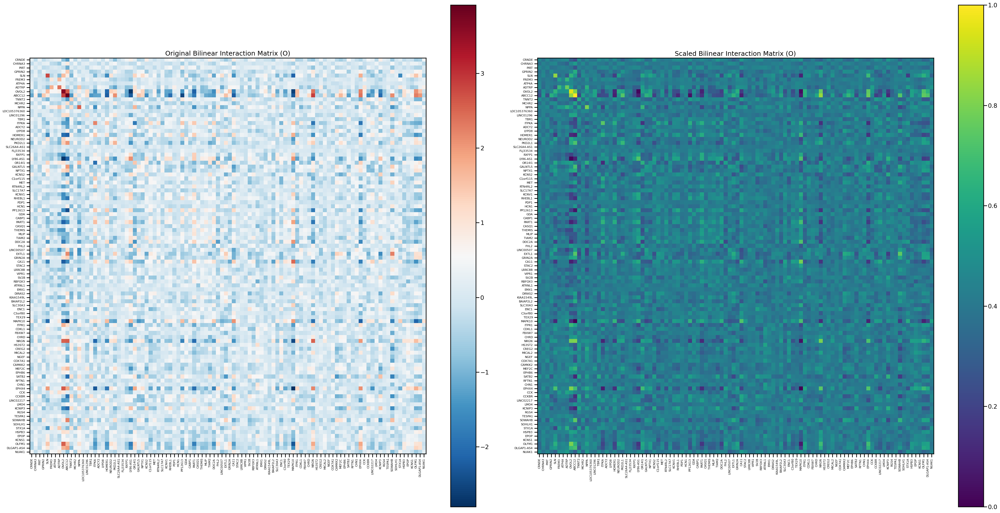

In [15]:
# Create figure with two subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(40,20))

# Plot original O matrix
im1 = ax1.imshow(O_matrix.cpu().detach().numpy(), cmap='RdBu_r', aspect='equal')
fig.colorbar(im1, ax=ax1)
ax1.set_xticks(range(len(valid_genes_hvg)))
ax1.set_yticks(range(len(valid_genes_hvg)))
ax1.set_xticklabels(valid_genes_hvg, rotation=90, fontsize=8)
ax1.set_yticklabels(valid_genes_hvg, fontsize=8)
ax1.set_title('Original Bilinear Interaction Matrix (O)')

# Plot scaled O matrix 
O_scaled = (O_matrix - O_matrix.min()) / (O_matrix.max() - O_matrix.min())
im2 = ax2.imshow(O_scaled.cpu().detach().numpy(), cmap='viridis', aspect='equal', vmin=0, vmax=1)
fig.colorbar(im2, ax=ax2)
ax2.set_xticks(range(len(valid_genes_hvg)))
ax2.set_yticks(range(len(valid_genes_hvg)))
ax2.set_xticklabels(valid_genes_hvg, rotation=90, fontsize=8)
ax2.set_yticklabels(valid_genes_hvg, fontsize=8)
ax2.set_title('Scaled Bilinear Interaction Matrix (O)')

plt.tight_layout()
plt.show()



Grab Attention matrix from Cross attention

In [16]:
# Load pretrained Cross Attention GeneVec model
cross_attention_hvg = CrossAttentionGeneVecModel(
    input_dim=X_hvg.shape[1],
    region_pair_dataset=hvg_dataset,
    expression_bins=5,
    genevec_type='one_hot',
    d_model=32,
    nhead=2,
    num_layers=2,
    deep_hidden_dims=[256, 128, 64],
    cls_init='random',
    pooling_mode='attention',
    use_alibi=True,
    transformer_dropout=0.3,
    dropout_rate=0.1,
    learning_rate=0.00009,
    weight_decay=0.001,
    bidirectional=True
).to('cuda')

# Load saved model weights
cross_attention_hvg.load_state_dict(torch.load('models/saved_models/UKBB_cross_full.pt'))


# Create HVG pairwise dataset
hvg_dataset = RegionPairDataset(
    X=X_hvg_valid,
    Y=Y_valid,
    coords=coords_valid, 
    dataset='UKBB',
    parcellation='S456',
    valid2true_mapping=valid2true_mapping,
    valid_genes=valid_genes_hvg
)


  warnings.warn(



Using SymmetricLoss with lambda_sym=0.1
Created one-hot embeddings: 100 genes with 100-dimensional embeddings
Using all valid genes for one-hot encoding
Number of learnable parameters in CrossAttentionGeneVec model: 82760
Expression bins: 5
CLS token initialization: random


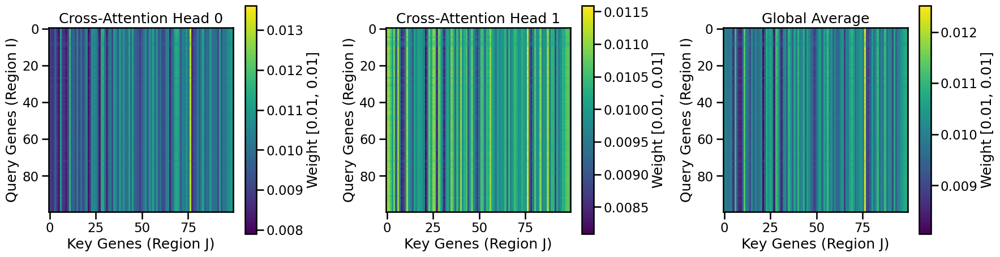

Number of attention heads: 2
Shape of each head: (100, 100)
Shape of global average: (100, 100)


In [17]:
# Create a test loader from your HVG dataset
from torch.utils.data import DataLoader
import numpy as np

# Create loader for full dataset
test_loader = DataLoader(hvg_dataset, batch_size=512, shuffle=False, num_workers=2)

# Extract attention weights using your loaded model
predictions, targets, avg_attn = cross_attention_hvg.predict(test_loader, collect_attn=True)

# Get individual heads and global average
individual_heads, global_average = cross_attention_hvg.get_attention_heads(avg_attn)

# Now you can analyze the attention patterns
print(f"Number of attention heads: {len(individual_heads)}")
print(f"Shape of each head: {individual_heads[0].shape}")
print(f"Shape of global average: {global_average.shape}")


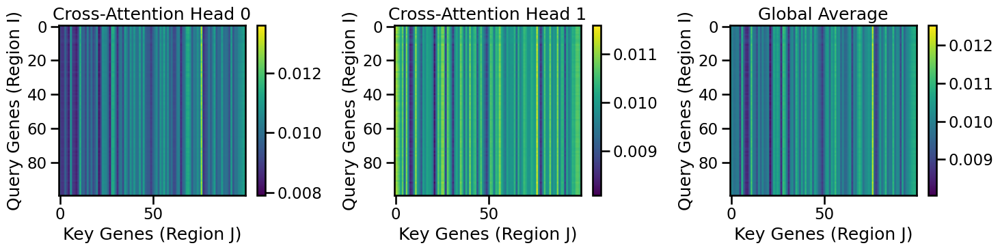

Head 0: mean=0.0100, max=0.0136, std=0.0009
Head 1: mean=0.0100, max=0.0116, std=0.0007
Global average: mean=0.0100, max=0.0125

Top 10 most attended gene pairs (query_gene_idx, key_gene_idx):
  Gene 0 -> Gene 76: 0.0125
  Gene 2 -> Gene 76: 0.0124
  Gene 11 -> Gene 76: 0.0124
  Gene 92 -> Gene 76: 0.0124
  Gene 54 -> Gene 76: 0.0124
  Gene 29 -> Gene 76: 0.0124
  Gene 26 -> Gene 76: 0.0123
  Gene 74 -> Gene 76: 0.0123
  Gene 68 -> Gene 76: 0.0123
  Gene 40 -> Gene 76: 0.0123


In [18]:
fig, axes = plt.subplots(1, len(individual_heads) + 1, figsize=(15, 4))

# Plot individual heads
for i, head in enumerate(individual_heads):
    im = axes[i].imshow(head, cmap='viridis', aspect='auto')
    axes[i].set_title(f'Cross-Attention Head {i}')
    axes[i].set_xlabel('Key Genes (Region J)')
    axes[i].set_ylabel('Query Genes (Region I)')
    plt.colorbar(im, ax=axes[i])

# Plot global average
im = axes[-1].imshow(global_average, cmap='viridis', aspect='auto')
axes[-1].set_title('Global Average')
axes[-1].set_xlabel('Key Genes (Region J)')
axes[-1].set_ylabel('Query Genes (Region I)')
plt.colorbar(im, ax=axes[-1])

plt.tight_layout()
plt.show()

# Example: analyze attention statistics
for i, head in enumerate(individual_heads):
    print(f"Head {i}: mean={head.mean():.4f}, max={head.max():.4f}, std={head.std():.4f}")

print(f"Global average: mean={global_average.mean():.4f}, max={global_average.max():.4f}")

# Example: find most attended gene pairs
# Get top 10 most attended gene pairs in global average
flat_indices = np.argsort(global_average.flatten())[-10:]
top_pairs = np.unravel_index(flat_indices, global_average.shape)

print("\nTop 10 most attended gene pairs (query_gene_idx, key_gene_idx):")
for i in range(10):
    query_idx = top_pairs[0][-(i+1)]
    key_idx = top_pairs[1][-(i+1)]
    attention_weight = global_average[query_idx, key_idx]
    print(f"  Gene {query_idx} -> Gene {key_idx}: {attention_weight:.4f}")

SMT mini self attention analysis

Using SymmetricLoss with lambda_sym=0.1
Created one-hot embeddings: 100 genes with 100-dimensional embeddings
Using all valid genes for one-hot encoding


  warnings.warn(



Number of learnable parameters in SelfAttentionGeneVec model: 125474
Expression bins: 100
Pooling mode: linear
ROI combination: concat
Embedding list shape: (455, 100)
Raw expression shape: (455, 100)


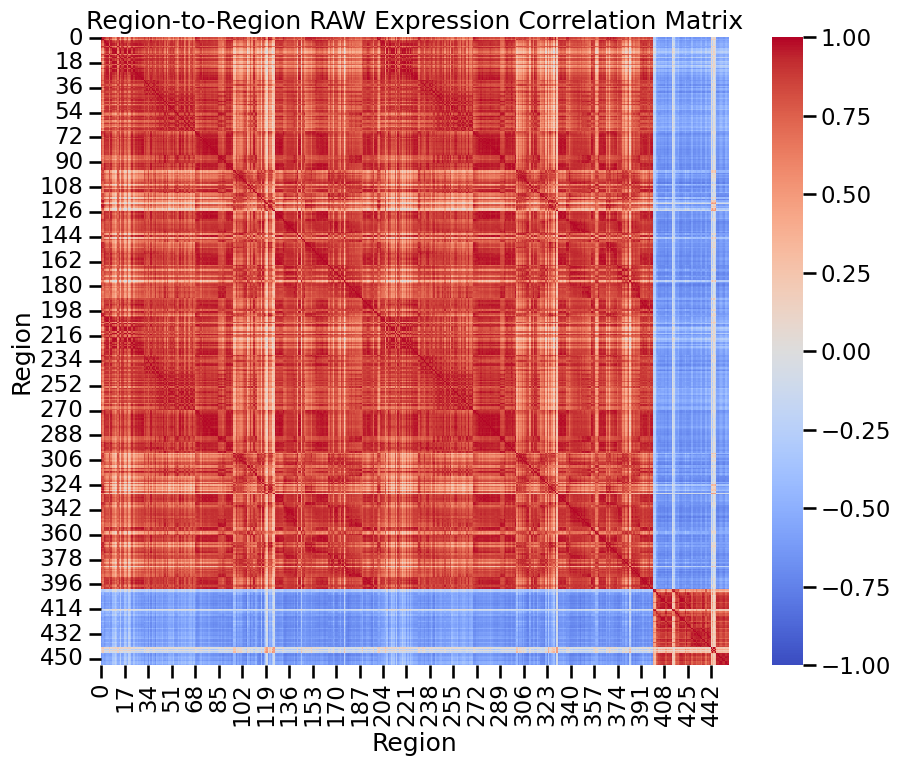

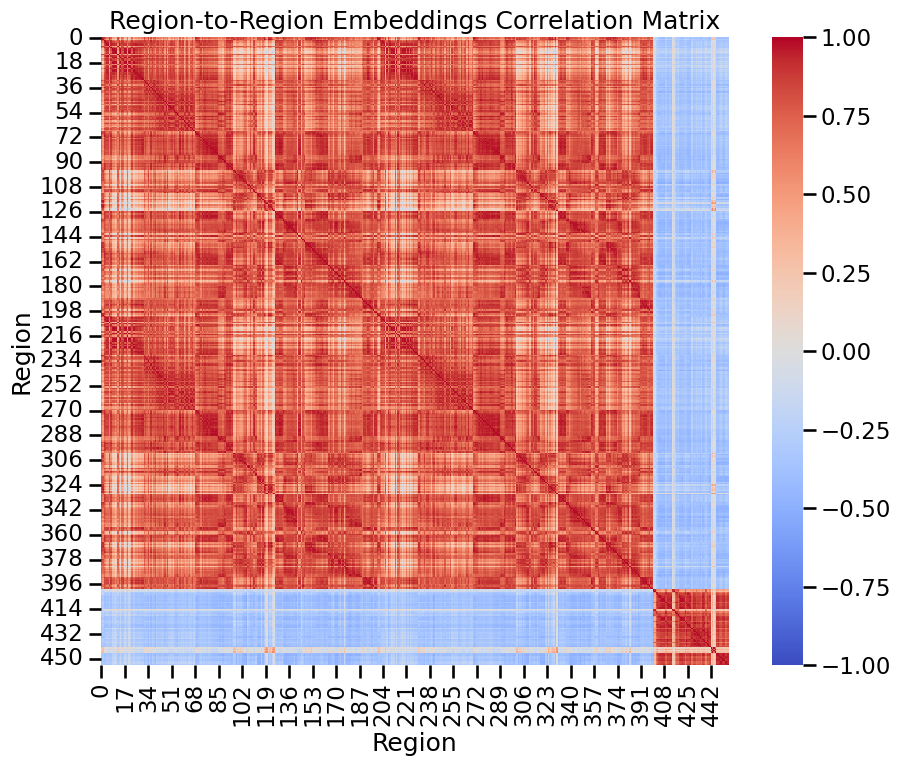

  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")



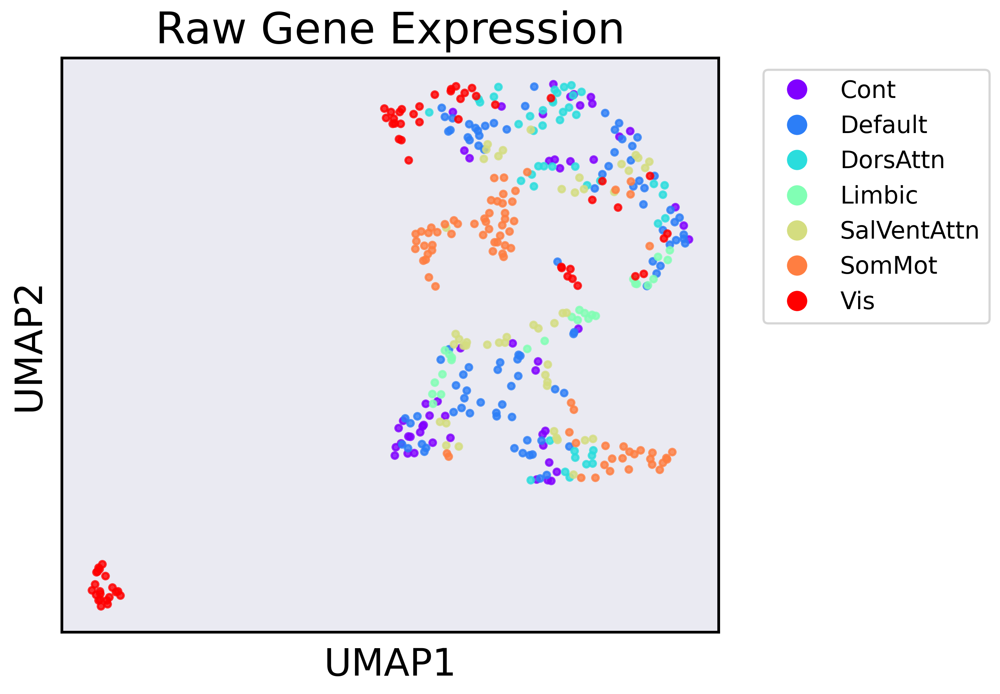

  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")



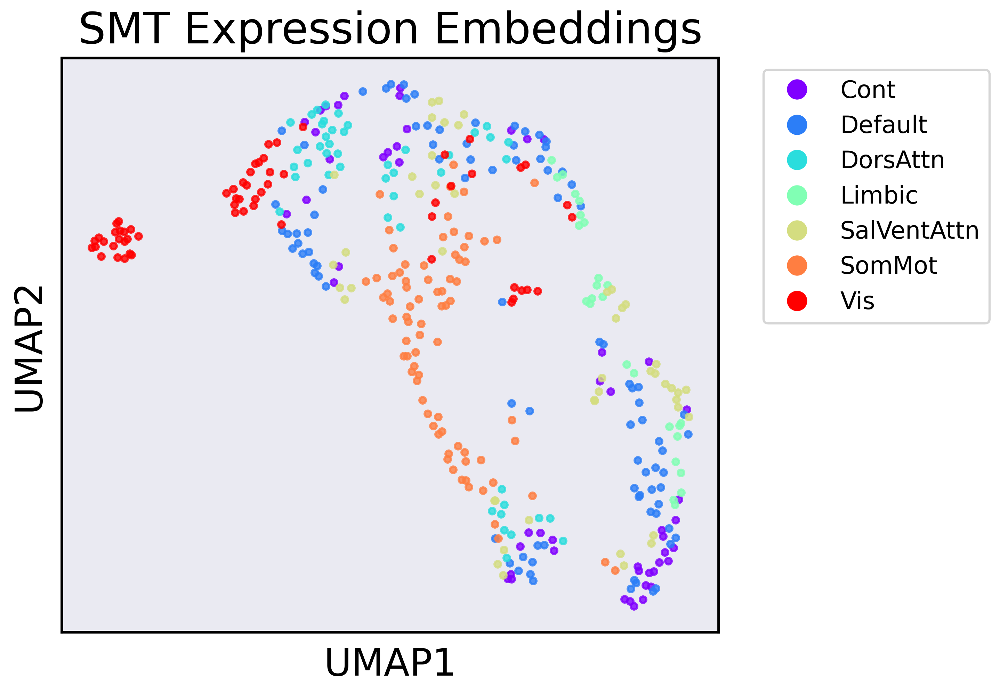

In [7]:
from models.smt_cross import SelfAttentionGeneVecModel

# Load pretrained Cross Attention GeneVec model
self_attention_hvg = SelfAttentionGeneVecModel(
    input_dim=X_hvg.shape[1],
    region_pair_dataset=hvg_dataset,
    expression_bins=100,
    genevec_type='one_hot',
    d_model=32,
    nhead=2,
    num_layers=2,
    deep_hidden_dims=[256, 128, 64],
    pooling_mode='linear',
    use_alibi=True,
    transformer_dropout=0.1,
    dropout_rate=0.1,
    learning_rate=0.00009,
    weight_decay=0.001
).to('cuda')

# Load saved model weights
self_attention_hvg.load_state_dict(torch.load('models/saved_models/UKBB_self_linear_pool.pt'))

# Create HVG pairwise dataset
hvg_dataset = RegionPairDataset(
    X=X_hvg_valid,
    Y=Y_valid,
    coords=coords_valid, 
    dataset='UKBB',
    parcellation='S456',
    valid2true_mapping=valid2true_mapping,
    valid_genes=valid_genes_hvg
)

# --- Script-like analysis for any passed-in self_attention_hvg model variant ---
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import torch
from data.data_viz import plot_coords_w_fc, plot_umap_embeddings_w_fc

# Fetch a batch and get embeddings via encoder
embeddings_list = []

with torch.no_grad():
    for batch in dataloader_hvg:
        gene_expr_i = batch[0].to('cuda')
        # NOTE: assumes model encoder inputs gene_expr_i as both arguments (update as needed)
        embedding_i = self_attention_hvg.encoder(gene_expr_i, gene_expr_i).cpu().numpy()
        # Truncate or use full embedding as appropriate for the model
        embeddings_list.append(embedding_i[:, :100] if embedding_i.shape[1] >= 100 else embedding_i)
        break  # Only need one batch for visualizations

embeddings_list = np.array(embeddings_list).reshape(-1, embeddings_list[0].shape[1])
print("Embedding list shape:", embeddings_list.shape)

# ---- Raw gene expression correlation matrix ----
raw_expr = gene_expr_i.cpu().numpy()  # shape: (num_regions, num_genes)
print("Raw expression shape:", raw_expr.shape)

corr_matrix_raw = np.corrcoef(raw_expr)  # shape (num_regions, num_regions)

plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix_raw, vmin=-1, vmax=1, cmap='coolwarm', square=True)
plt.title("Region-to-Region RAW Expression Correlation Matrix")
plt.xlabel("Region")
plt.ylabel("Region")
plt.tight_layout()
plt.show()

# ---- Embedding correlation matrix ----
corr_matrix = np.corrcoef(embeddings_list)  # shape (num_regions, num_regions)

plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, vmin=-1, vmax=1, cmap='coolwarm', square=True)
plt.title("Region-to-Region Embeddings Correlation Matrix")
plt.xlabel("Region")
plt.ylabel("Region")
plt.tight_layout()
plt.show()

# ---- UMAP/Embedding Visualizations ----

plot_umap_embeddings_w_fc(
    raw_expr, 
    network_labels, 
    conn_matrix=Y_valid, 
    title="Raw Gene Expression",  
    omit_subcortical=True, 
    edge_alpha=0.3, 
    edge_width=0.5, 
    enhance_legend=False
)

plot_umap_embeddings_w_fc(
    embeddings_list, 
    network_labels, 
    conn_matrix=Y_valid, 
    title="SMT Expression Embeddings", 
    omit_subcortical=True, 
    edge_alpha=0.3, 
    edge_width=0.5, 
    enhance_legend=False
)



In [14]:

model = self_attention_hvg
device = 'cuda'

# During prediction/inference, enable attention collection
model.encoder.setup_attention_collection()

# Run prediction on your test data
predictions = []
total_batches = 0

test_loader = hvg_dataloader 


for batch_idx, (batch_X, batch_coords, batch_idx_tensor, batch_y) in enumerate(test_loader):
    batch_X = batch_X.to(device)
    batch_coords = batch_coords.to(device) 
    batch_idx_tensor = batch_idx_tensor.to(device)
    
    with torch.no_grad():
        pred = model(batch_X, batch_coords, batch_idx_tensor)
        predictions.append(pred.cpu())
        
        # Accumulate attention weights
        is_first_batch = (batch_idx == 0)
        model.encoder.accumulate_attention_weights(is_first_batch=is_first_batch)
        total_batches += 1

# Process and visualize the accumulated attention weights
avg_attn = model.encoder.process_attention_weights(
    total_batches=total_batches, 
    save_attn_path="self_attention_heads.npy"  # optional: save to file
)

  gene2vec_df = pd.read_csv(self.gene2vec_path, sep='\s+', header=None, index_col=0)



IndexError: Dimension out of range (expected to be in range of [-1, 0], but got 1)

  warnings.warn(



Using SymmetricLoss with lambda_sym=0.1
Created one-hot embeddings: 100 genes with 100-dimensional embeddings
Using all valid genes for one-hot encoding
Number of learnable parameters in SelfAttentionGeneVec model: 93890
Expression bins: 100
Pooling mode: attention
ROI combination: concat
Embedding list shape: (455, 32)
Raw expression shape: (455, 100)


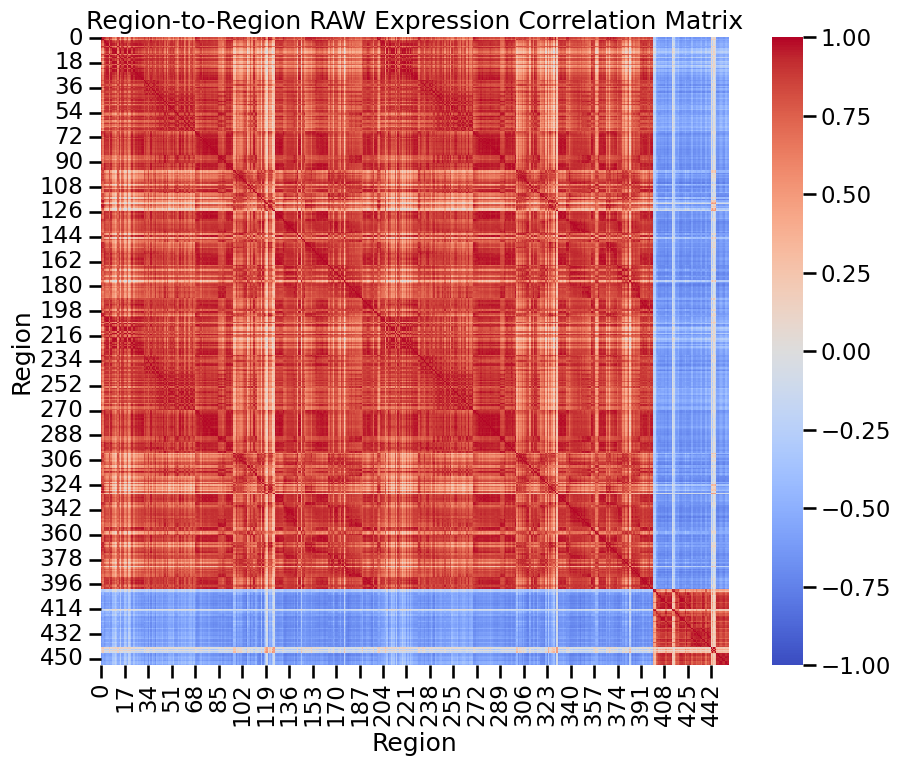

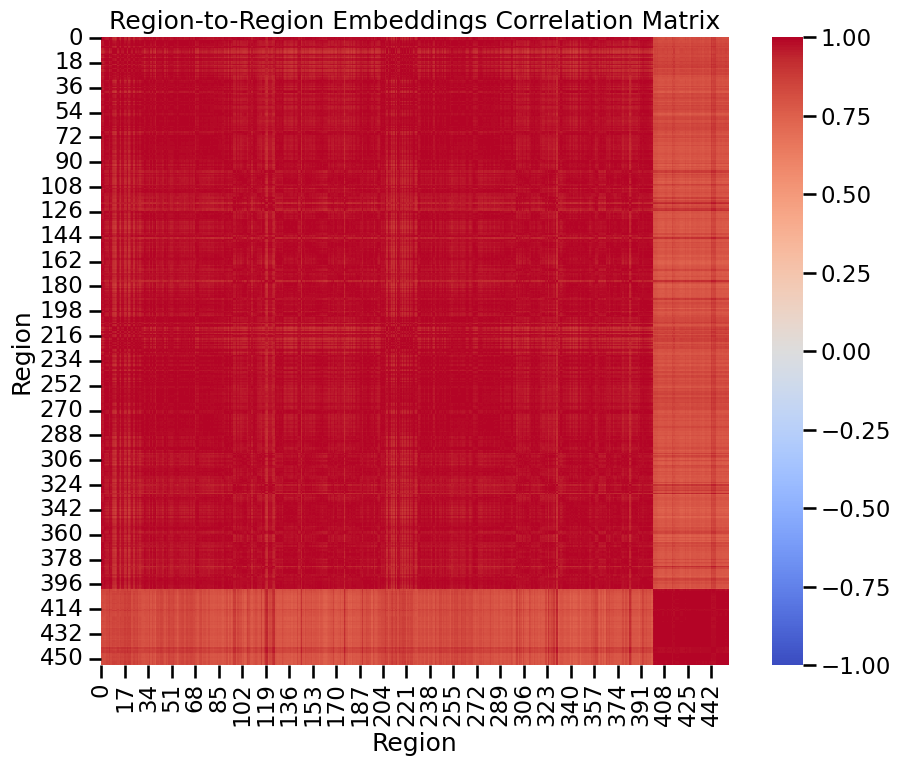

  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")



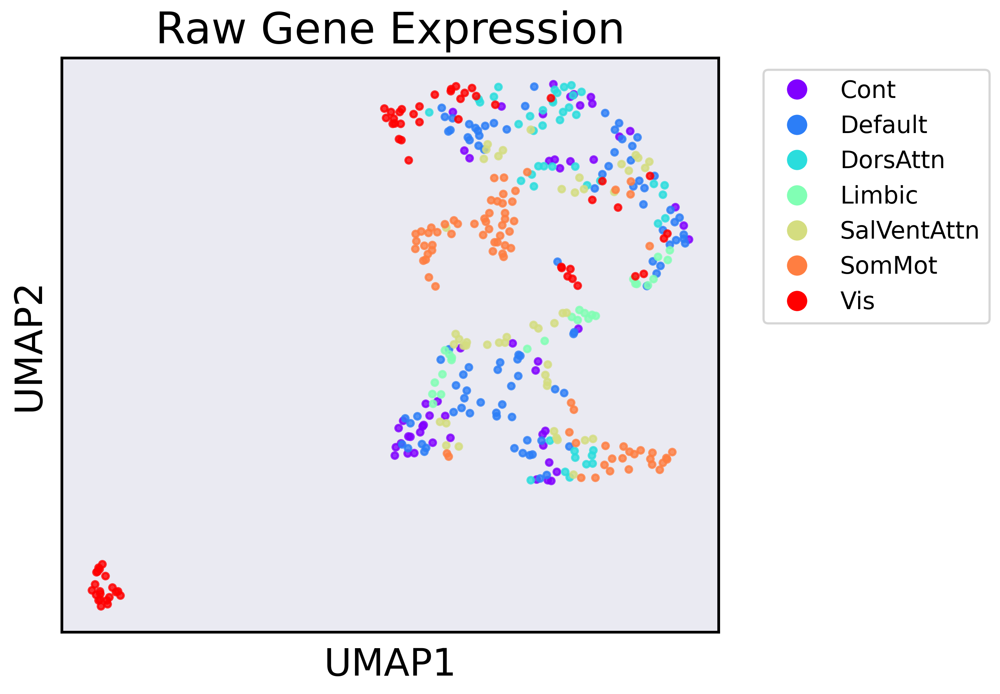

  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")



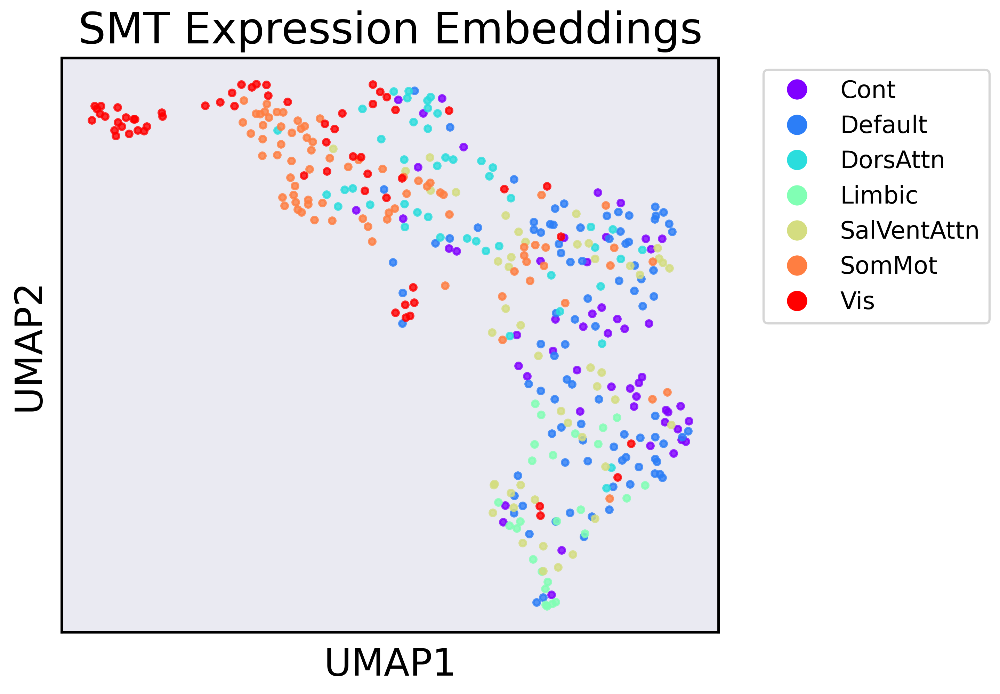

In [8]:
from models.smt_cross import SelfAttentionGeneVecModel

# Load pretrained Cross Attention GeneVec model
self_attention_hvg = SelfAttentionGeneVecModel(
    input_dim=X_hvg.shape[1],
    region_pair_dataset=hvg_dataset,
    expression_bins=100,
    genevec_type='one_hot',
    d_model=32,
    nhead=2,
    num_layers=2,
    deep_hidden_dims=[256, 128, 64],
    pooling_mode='attention',
    use_alibi=True,
    transformer_dropout=0.1,
    dropout_rate=0.1,
    learning_rate=0.00009,
    weight_decay=0.001
).to('cuda')

# Load saved model weights
self_attention_hvg.load_state_dict(torch.load('models/saved_models/UKBB_self_attn_pool.pt'))

# Create HVG pairwise dataset
hvg_dataset = RegionPairDataset(
    X=X_hvg_valid,
    Y=Y_valid,
    coords=coords_valid, 
    dataset='UKBB',
    parcellation='S456',
    valid2true_mapping=valid2true_mapping,
    valid_genes=valid_genes_hvg
)

# --- Script-like analysis for any passed-in self_attention_hvg model variant ---
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import torch
from data.data_viz import plot_coords_w_fc, plot_umap_embeddings_w_fc

# Fetch a batch and get embeddings via encoder
embeddings_list = []

with torch.no_grad():
    for batch in dataloader_hvg:
        gene_expr_i = batch[0].to('cuda')
        # NOTE: assumes model encoder inputs gene_expr_i as both arguments (update as needed)
        embedding_i = self_attention_hvg.encoder(gene_expr_i, gene_expr_i).cpu().numpy()
        # Truncate or use full embedding as appropriate for the model
        embeddings_list.append(embedding_i[:, :32] if embedding_i.shape[1] >= 32 else embedding_i)
        break  # Only need one batch for visualizations

embeddings_list = np.array(embeddings_list).reshape(-1, embeddings_list[0].shape[1])
print("Embedding list shape:", embeddings_list.shape)

# ---- Raw gene expression correlation matrix ----
raw_expr = gene_expr_i.cpu().numpy()  # shape: (num_regions, num_genes)
print("Raw expression shape:", raw_expr.shape)

corr_matrix_raw = np.corrcoef(raw_expr)  # shape (num_regions, num_regions)

plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix_raw, vmin=-1, vmax=1, cmap='coolwarm', square=True)
plt.title("Region-to-Region RAW Expression Correlation Matrix")
plt.xlabel("Region")
plt.ylabel("Region")
plt.tight_layout()
plt.show()

# ---- Embedding correlation matrix ----
corr_matrix = np.corrcoef(embeddings_list)  # shape (num_regions, num_regions)

plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, vmin=-1, vmax=1, cmap='coolwarm', square=True)
plt.title("Region-to-Region Embeddings Correlation Matrix")
plt.xlabel("Region")
plt.ylabel("Region")
plt.tight_layout()
plt.show()

# ---- UMAP/Embedding Visualizations ----

plot_umap_embeddings_w_fc(
    raw_expr, 
    network_labels, 
    conn_matrix=Y_valid, 
    title="Raw Gene Expression",  
    omit_subcortical=True, 
    edge_alpha=0.3, 
    edge_width=0.5, 
    enhance_legend=False
)

plot_umap_embeddings_w_fc(
    embeddings_list, 
    network_labels, 
    conn_matrix=Y_valid, 
    title="SMT Expression Embeddings", 
    omit_subcortical=True, 
    edge_alpha=0.3, 
    edge_width=0.5, 
    enhance_legend=False
)



Using SymmetricLoss with lambda_sym=0.1


  warnings.warn(



Loaded Gene2Vec embeddings: 94 genes with 200-dimensional embeddings
Gene overlap: 94/100 valid genes have Gene2Vec embeddings
Number of learnable parameters in SelfAttentionGeneVec model: 122562
Expression bins: 5
Pooling mode: linear
ROI combination: concat
Embedding list shape: (455, 94)
Raw expression shape: (455, 100)


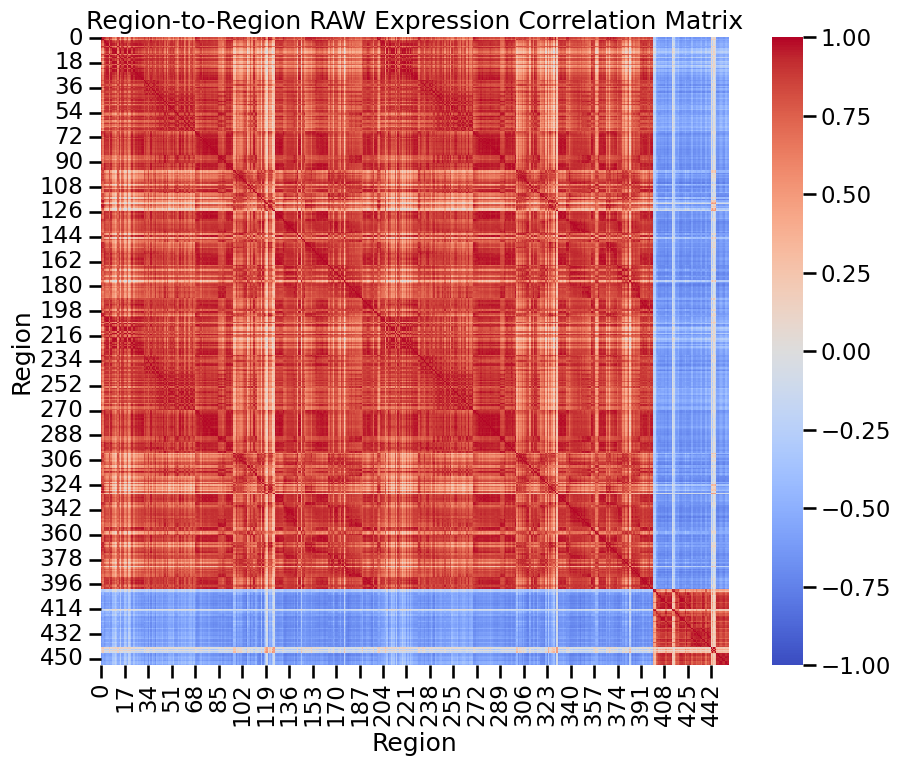

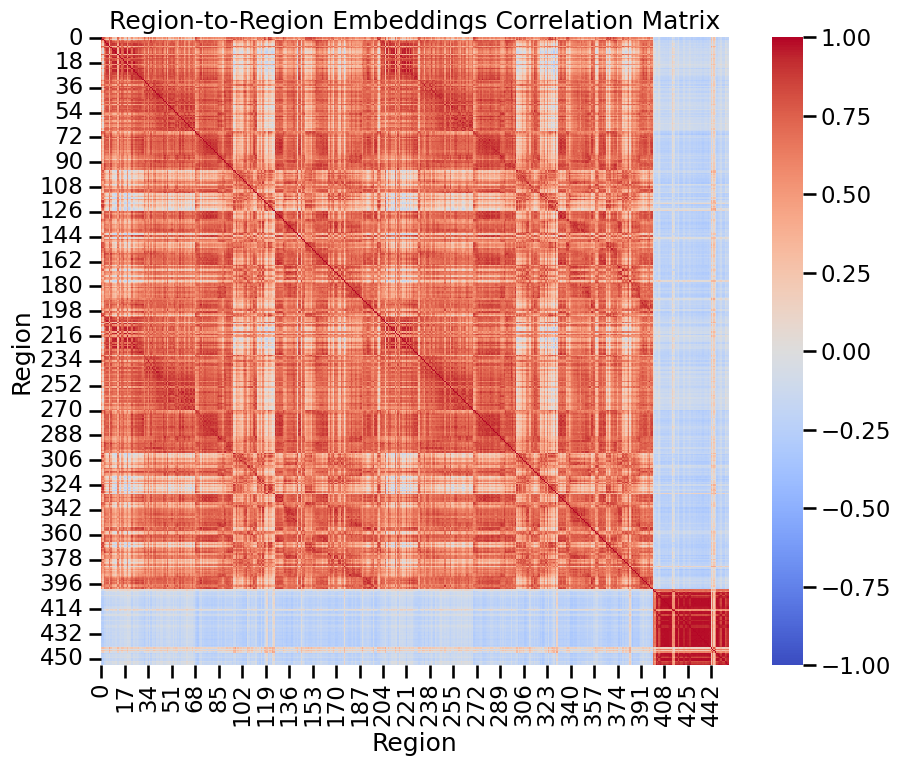

  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")



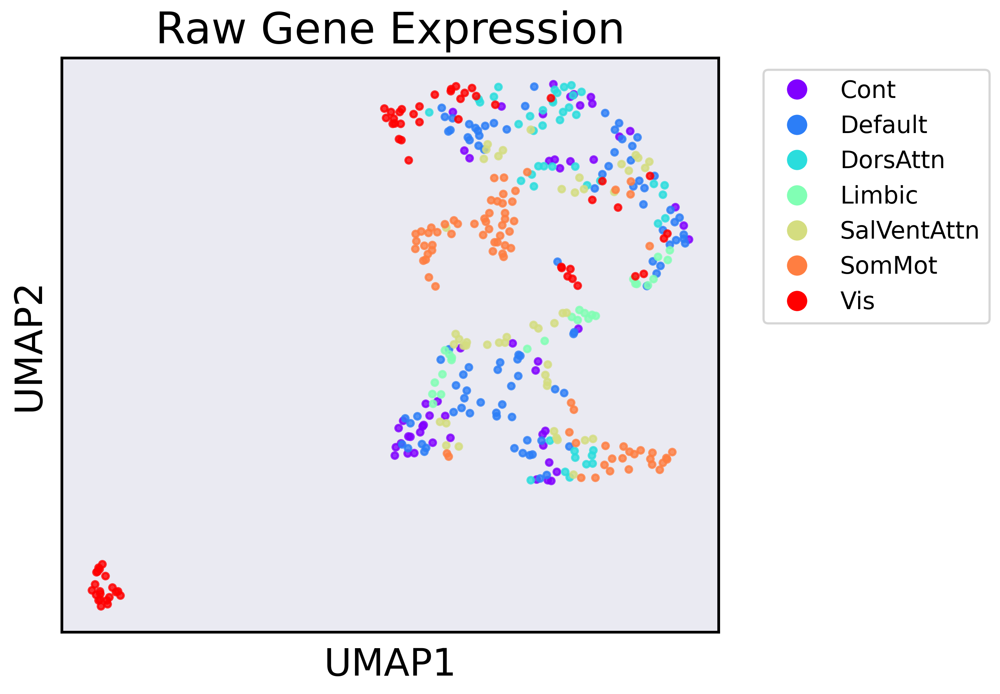

  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")



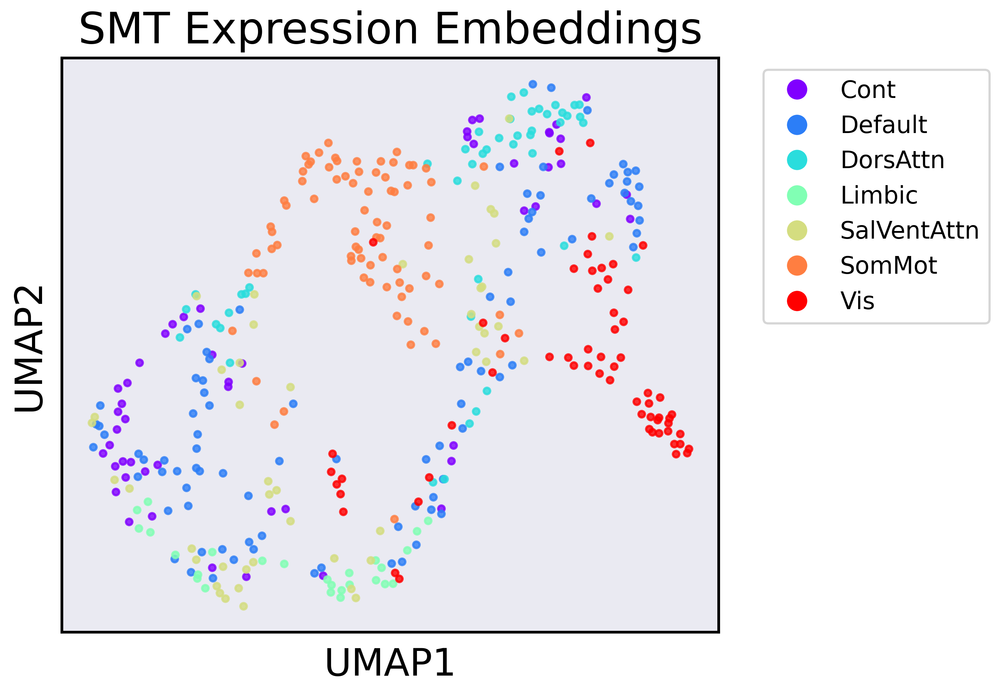

In [9]:
from models.smt_cross import SelfAttentionGeneVecModel

# Load pretrained Cross Attention GeneVec model
self_attention_hvg = SelfAttentionGeneVecModel(
    input_dim=X_hvg.shape[1],
    region_pair_dataset=hvg_dataset,
    expression_bins=5,
    genevec_type='gene2vec',
    d_model=32,
    nhead=2,
    num_layers=2,
    deep_hidden_dims=[256, 128, 64],
    pooling_mode='linear',
    use_alibi=True,
    transformer_dropout=0.1,
    dropout_rate=0.1,
    learning_rate=0.00009,
    weight_decay=0.001
).to('cuda')

# Load saved model weights
self_attention_hvg.load_state_dict(torch.load('models/saved_models/UKBB_self_linear_pool_scBERT.pt'))

# Create HVG pairwise dataset
hvg_dataset = RegionPairDataset(
    X=X_hvg_valid,
    Y=Y_valid,
    coords=coords_valid, 
    dataset='UKBB',
    parcellation='S456',
    valid2true_mapping=valid2true_mapping,
    valid_genes=valid_genes_hvg
)

# --- Script-like analysis for any passed-in self_attention_hvg model variant ---
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import torch
from data.data_viz import plot_coords_w_fc, plot_umap_embeddings_w_fc

# Fetch a batch and get embeddings via encoder
embeddings_list = []

with torch.no_grad():
    for batch in dataloader_hvg:
        gene_expr_i = batch[0].to('cuda')
        # NOTE: assumes model encoder inputs gene_expr_i as both arguments (update as needed)
        embedding_i = self_attention_hvg.encoder(gene_expr_i, gene_expr_i).cpu().numpy()
        # Truncate or use full embedding as appropriate for the model
        embeddings_list.append(embedding_i[:, :94] if embedding_i.shape[1] >= 94 else embedding_i)
        break  # Only need one batch for visualizations

embeddings_list = np.array(embeddings_list).reshape(-1, embeddings_list[0].shape[1])
print("Embedding list shape:", embeddings_list.shape)

# ---- Raw gene expression correlation matrix ----
raw_expr = gene_expr_i.cpu().numpy()  # shape: (num_regions, num_genes)
print("Raw expression shape:", raw_expr.shape)

corr_matrix_raw = np.corrcoef(raw_expr)  # shape (num_regions, num_regions)

plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix_raw, vmin=-1, vmax=1, cmap='coolwarm', square=True)
plt.title("Region-to-Region RAW Expression Correlation Matrix")
plt.xlabel("Region")
plt.ylabel("Region")
plt.tight_layout()
plt.show()

# ---- Embedding correlation matrix ----
corr_matrix = np.corrcoef(embeddings_list)  # shape (num_regions, num_regions)

plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, vmin=-1, vmax=1, cmap='coolwarm', square=True)
plt.title("Region-to-Region Embeddings Correlation Matrix")
plt.xlabel("Region")
plt.ylabel("Region")
plt.tight_layout()
plt.show()

# ---- UMAP/Embedding Visualizations ----

plot_umap_embeddings_w_fc(
    raw_expr, 
    network_labels, 
    conn_matrix=Y_valid, 
    title="Raw Gene Expression",  
    omit_subcortical=True, 
    edge_alpha=0.3, 
    edge_width=0.5, 
    enhance_legend=False
)

plot_umap_embeddings_w_fc(
    embeddings_list, 
    network_labels, 
    conn_matrix=Y_valid, 
    title="SMT Expression Embeddings", 
    omit_subcortical=True, 
    edge_alpha=0.3, 
    edge_width=0.5, 
    enhance_legend=False
)



Using SymmetricLoss with lambda_sym=0.1


  warnings.warn(



Loaded Gene2Vec embeddings: 94 genes with 200-dimensional embeddings
Gene overlap: 94/100 valid genes have Gene2Vec embeddings
Number of learnable parameters in SelfAttentionGeneVec model: 94050
Expression bins: 5
Pooling mode: attention
ROI combination: concat
Embedding list shape: (455, 32)
Raw expression shape: (455, 100)


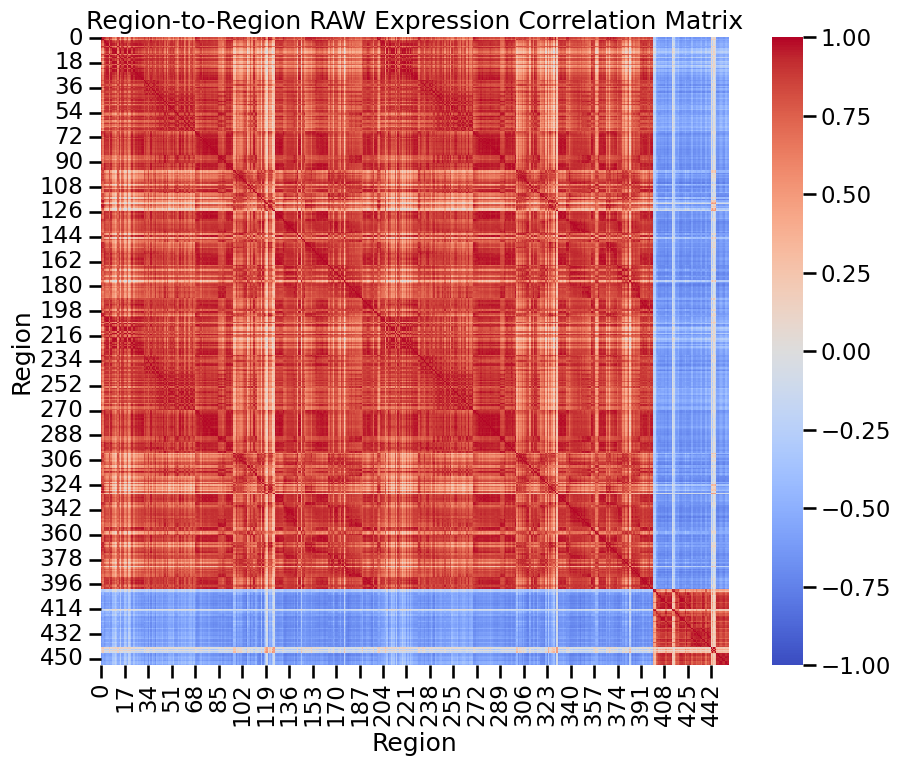

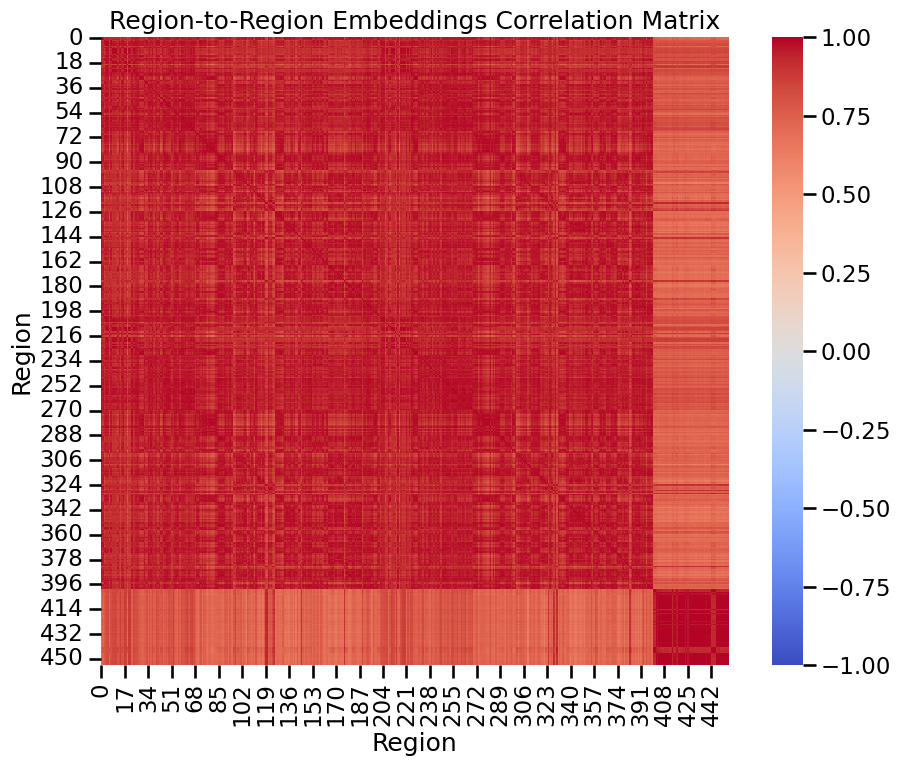

  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")



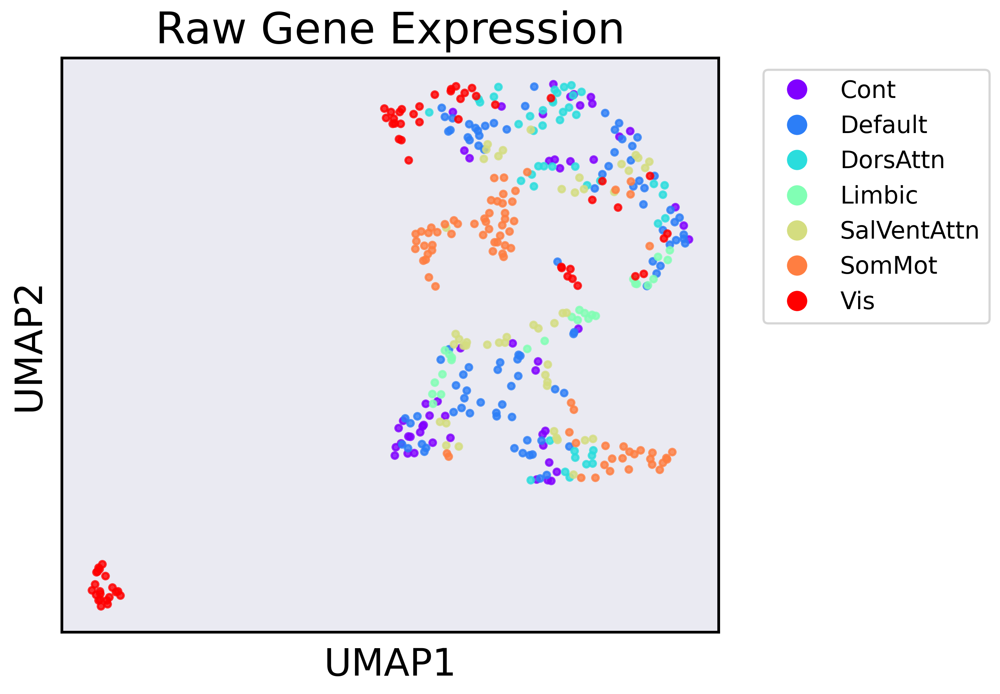

  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")



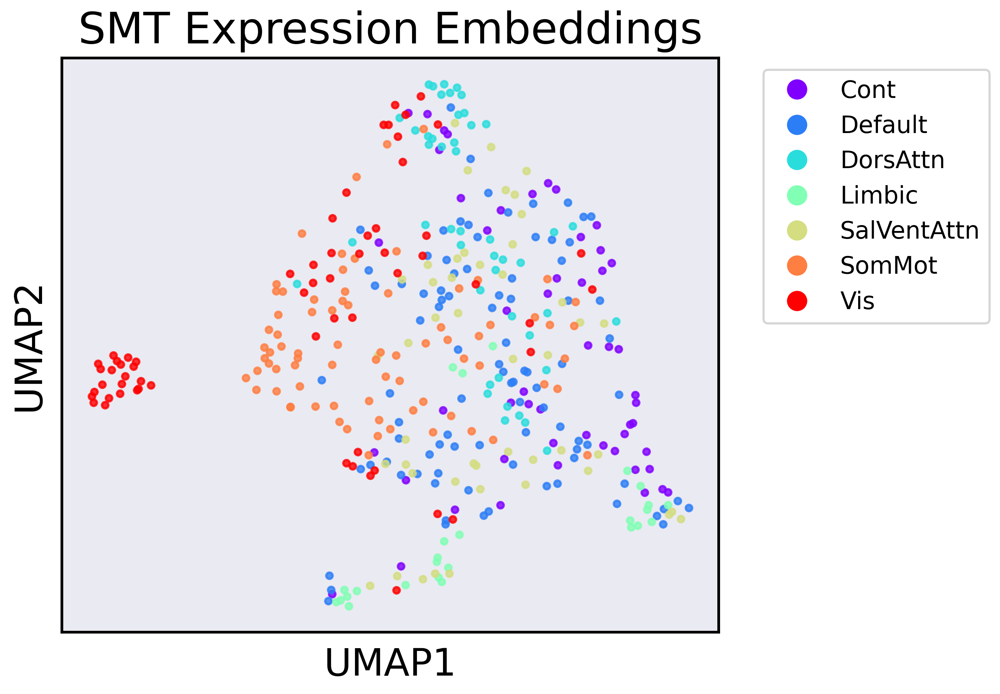

In [10]:
from models.smt_cross import SelfAttentionGeneVecModel

# Load pretrained Cross Attention GeneVec model
self_attention_hvg = SelfAttentionGeneVecModel(
    input_dim=X_hvg.shape[1],
    region_pair_dataset=hvg_dataset,
    expression_bins=5,
    genevec_type='gene2vec',
    d_model=32,
    nhead=2,
    num_layers=2,
    deep_hidden_dims=[256, 128, 64],
    pooling_mode='attention',
    use_alibi=True,
    transformer_dropout=0.1,
    dropout_rate=0.1,
    learning_rate=0.00009,
    weight_decay=0.001
).to('cuda')

# Load saved model weights
self_attention_hvg.load_state_dict(torch.load('models/saved_models/UKBB_self_attn_pool_scBERT.pt'))

# Create HVG pairwise dataset
hvg_dataset = RegionPairDataset(
    X=X_hvg_valid,
    Y=Y_valid,
    coords=coords_valid, 
    dataset='UKBB',
    parcellation='S456',
    valid2true_mapping=valid2true_mapping,
    valid_genes=valid_genes_hvg
)

# --- Script-like analysis for any passed-in self_attention_hvg model variant ---
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import torch
from data.data_viz import plot_coords_w_fc, plot_umap_embeddings_w_fc

# Fetch a batch and get embeddings via encoder
embeddings_list = []

with torch.no_grad():
    for batch in dataloader_hvg:
        gene_expr_i = batch[0].to('cuda')
        # NOTE: assumes model encoder inputs gene_expr_i as both arguments (update as needed)
        embedding_i = self_attention_hvg.encoder(gene_expr_i, gene_expr_i).cpu().numpy()
        # Truncate or use full embedding as appropriate for the model
        embeddings_list.append(embedding_i[:, :32] if embedding_i.shape[1] >= 32 else embedding_i)
        break  # Only need one batch for visualizations

embeddings_list = np.array(embeddings_list).reshape(-1, embeddings_list[0].shape[1])
print("Embedding list shape:", embeddings_list.shape)

# ---- Raw gene expression correlation matrix ----
raw_expr = gene_expr_i.cpu().numpy()  # shape: (num_regions, num_genes)
print("Raw expression shape:", raw_expr.shape)

corr_matrix_raw = np.corrcoef(raw_expr)  # shape (num_regions, num_regions)

plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix_raw, vmin=-1, vmax=1, cmap='coolwarm', square=True)
plt.title("Region-to-Region RAW Expression Correlation Matrix")
plt.xlabel("Region")
plt.ylabel("Region")
plt.tight_layout()
plt.show()

# ---- Embedding correlation matrix ----
corr_matrix = np.corrcoef(embeddings_list)  # shape (num_regions, num_regions)

plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, vmin=-1, vmax=1, cmap='coolwarm', square=True)
plt.title("Region-to-Region Embeddings Correlation Matrix")
plt.xlabel("Region")
plt.ylabel("Region")
plt.tight_layout()
plt.show()

# ---- UMAP/Embedding Visualizations ----

plot_umap_embeddings_w_fc(
    raw_expr, 
    network_labels, 
    conn_matrix=Y_valid, 
    title="Raw Gene Expression",  
    omit_subcortical=True, 
    edge_alpha=0.3, 
    edge_width=0.5, 
    enhance_legend=False
)

plot_umap_embeddings_w_fc(
    embeddings_list, 
    network_labels, 
    conn_matrix=Y_valid, 
    title="SMT Expression Embeddings", 
    omit_subcortical=True, 
    edge_alpha=0.3, 
    edge_width=0.5, 
    enhance_legend=False
)

